# Ablation Studies

## Rotation Ablation Studies - Confidence Scores
1. See how different versions of ResNet compare and drop in performance with rotations of certain images

2. Davida's Number Images

In [1]:
!pip install torchvision

In [2]:
### LIBRARY IMPORTS
from google.colab import files
from torchvision import models
from PIL import Image
import os

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
"""
  ALGORITHM:

  1. We have the truth label
  2. I want to see the confidence of the model dropping when given a different orientation of that image
  3. See the differences when you freeze different layers of resnet 18 in the confidence dropping

"""

'\n  ALGORITHM:\n\n  1. We have the truth label\n  2. I want to see the confidence of the model dropping when given a different orientation of that image\n  3. See the differences when you freeze different layers of resnet 18 in the confidence dropping\n\n'

In [5]:
import string

# Generate labels from A to Z
letters = list(string.ascii_uppercase)

# Generate numbers from 0 to 9
numbers = list(range(10))

# Combine letters and numbers
all_labels = letters + numbers

# Create label mapping
label_mapping = {label: idx for idx, label in enumerate(all_labels)}

print(label_mapping)


{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'J': 9, 'K': 10, 'L': 11, 'M': 12, 'N': 13, 'O': 14, 'P': 15, 'Q': 16, 'R': 17, 'S': 18, 'T': 19, 'U': 20, 'V': 21, 'W': 22, 'X': 23, 'Y': 24, 'Z': 25, 0: 26, 1: 27, 2: 28, 3: 29, 4: 30, 5: 31, 6: 32, 7: 33, 8: 34, 9: 35}


In [11]:
import torch
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image

# Load pretrained ResNet-18
model = models.resnet34(pretrained=True)
model.eval()

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def get_image_confidence(model, image_path, true_label):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = F.softmax(outputs, dim=1)
        target_index = label_mapping[true_label]  # Ensure label_mapping is available
        confidence = probabilities[0][target_index].item()
    return confidence




/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 231MB/s]


In [12]:
folder_path = "/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts"

In [13]:
import re
pattern = r'^([A-Z])_(1|2|3|4)(_\d{1,3})?\.png$'

def sorting_key(img):
    match = re.match(pattern, img)
    if not match:
        return None
    alphabet = match.group(1)
    classname = int(match.group(2))
    orientation = int(match.group(3).replace("_", "")) if match.group(3) else 0
    return (alphabet, classname, orientation)

# Filter based on regex and then sort
all_files = os.listdir(folder_path)
sorted_files = sorted((file_name for file_name in all_files if sorting_key(file_name)), key=sorting_key)


print(sorted_files)

['A_1.png', 'A_1_20.png', 'A_1_40.png', 'A_1_60.png', 'A_1_80.png', 'A_1_100.png', 'A_1_120.png', 'A_1_140.png', 'A_1_160.png', 'A_1_180.png', 'A_1_200.png', 'A_1_220.png', 'A_1_240.png', 'A_1_260.png', 'A_1_280.png', 'A_1_300.png', 'A_1_320.png', 'A_1_340.png', 'A_1_360.png', 'A_2.png', 'A_2_20.png', 'A_2_40.png', 'A_2_60.png', 'A_2_80.png', 'A_2_100.png', 'A_2_120.png', 'A_2_140.png', 'A_2_160.png', 'A_2_180.png', 'A_2_200.png', 'A_2_220.png', 'A_2_240.png', 'A_2_260.png', 'A_2_280.png', 'A_2_300.png', 'A_2_320.png', 'A_2_340.png', 'A_2_360.png', 'A_3.png', 'A_3_20.png', 'A_3_40.png', 'A_3_60.png', 'A_3_80.png', 'A_3_100.png', 'A_3_120.png', 'A_3_140.png', 'A_3_160.png', 'A_3_180.png', 'A_3_200.png', 'A_3_220.png', 'A_3_240.png', 'A_3_260.png', 'A_3_280.png', 'A_3_300.png', 'A_3_320.png', 'A_3_340.png', 'A_3_360.png', 'A_4.png', 'A_4_20.png', 'A_4_40.png', 'A_4_60.png', 'A_4_80.png', 'A_4_100.png', 'A_4_120.png', 'A_4_140.png', 'A_4_160.png', 'A_4_180.png', 'A_4_200.png', 'A_4_220.pn

In [14]:
# RegEx Pattern

confidence_scores = {}

for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)

        # Use the 'alphabet' as the true_label to get the confidence score for the image
        confidence = get_image_confidence(model, full_path, alphabet)

        # Group scores in the dictionary
        if alphabet_class_key in confidence_scores:
            confidence_scores[alphabet_class_key].append(confidence)
        else:
            confidence_scores[alphabet_class_key] = [confidence]

In [15]:
import copy

In [16]:
model = models.resnet34(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [17]:
# LAYER 1 ABLATED
confidence_scores_1_ablated = {}
ablated_model_1 = copy.deepcopy(model)
setattr(ablated_model_1, 'layer1', torch.nn.Identity())

for index, file_name in enumerate(sorted_files):
  match = re.match(pattern, file_name)
  if match:
    alphabet = match.group(1)  # Extracting the alphabet
    alphabet_class_key = f"{alphabet}_{match.group(2)}"
    full_path = os.path.join(folder_path, file_name)

    # Use the 'alphabet' as the true_label to get the confidence score for the image
    confidence = get_image_confidence(ablated_model_1, full_path, alphabet)

    # Group scores in the dictionary
    if alphabet_class_key in confidence_scores_1_ablated:
        confidence_scores_1_ablated[alphabet_class_key].append(confidence)
    else:
        confidence_scores_1_ablated[alphabet_class_key] = [confidence]

In [ ]:
def get_resnet_variant(model):
    model_name = type(model).__name__
    if "ResNet" in model_name:
        return model_name
    else:
        return "Unknown ResNet variant"

print(get_resnet_variant(model))

In [27]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def get_image_confidence(model, image_path, true_label):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)
    print(true_label)
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = F.softmax(outputs, dim=1)
        target_index = label_mapping[true_label]  # Ensure label_mapping is available
        confidence = probabilities[0][target_index].item()
    return confidence

In [28]:
import torchvision.models as models
import torch.nn as nn
import torch
import copy

In [29]:
# LAYER 2 ABLATED

confidence_scores_2_ablated = {}
ablated_model_2 = copy.deepcopy(model)
setattr(ablated_model_2, 'layer2', torch.nn.Identity())

ablated_model_2.layer3[0].conv1 = nn.Conv2d(64, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
ablated_model_2.layer3[0].downsample[0] = nn.Conv2d(64, 256, kernel_size=(1, 1), stride=(2, 2), bias=False)

for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)

        # Use the 'alphabet' as the true_label to get the confidence score for the image
        confidence = get_image_confidence(ablated_model_2, full_path, alphabet)

        # Group scores in the dictionary
        if alphabet_class_key in confidence_scores_2_ablated:
            confidence_scores_2_ablated[alphabet_class_key].append(confidence)
        else:
            confidence_scores_2_ablated[alphabet_class_key] = [confidence]

A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G


In [30]:
# LAYER 3 ABLATED

confidence_scores_3_ablated = {}
ablated_model_3 = copy.deepcopy(model)
ablated_model_3.layer3 = torch.nn.Identity()

# Adjust the first block of layer4 to accept 128 channels
ablated_model_3.layer4[0].conv1 = nn.Conv2d(128, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
ablated_model_3.layer4[0].downsample[0] = nn.Conv2d(128, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)

for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
      alphabet = match.group(1)  # Extracting the alphabet
      alphabet_class_key = f"{alphabet}_{match.group(2)}"
      full_path = os.path.join(folder_path, file_name)

      # Use the 'alphabet' as the true_label to get the confidence score for the image
      confidence = get_image_confidence(ablated_model_3, full_path, alphabet)

      # Group scores in the dictionary
      if alphabet_class_key in confidence_scores_3_ablated:
          confidence_scores_3_ablated[alphabet_class_key].append(confidence)
      else:
          confidence_scores_3_ablated[alphabet_class_key] = [confidence]

A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G


In [31]:
# LAYER 4 ABLATED

confidence_scores_4_ablated = {}
ablated_model_4 = copy.deepcopy(model)
setattr(ablated_model_4, 'layer4', torch.nn.Identity())
ablated_model_4.fc = nn.Linear(256, 26)
for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)

        # Use the 'alphabet' as the true_label to get the confidence score for the image
        confidence = get_image_confidence(ablated_model_4, full_path, alphabet)

        # Group scores in the dictionary
        if alphabet_class_key in confidence_scores_4_ablated:
            confidence_scores_4_ablated[alphabet_class_key].append(confidence)
        else:
            confidence_scores_4_ablated[alphabet_class_key] = [confidence]

A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
A
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
B
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
D
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
E
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
F
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G
G


In [36]:
import csv

# Define the path on your Google Drive where you want to save the CSV
save_path = "/content/drive/MyDrive/ISCR/experiment_data/resnet34_layer4_freeze_confidence_scores.csv"

with open(save_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)

    # Writing the header
    orientations = list(range(0, 361, 20))  # Assuming increments of 20 for orientation
    writer.writerow(['ALPHABET', 'CLASS'] + orientations)

    # Writing the data
    for key, differences in confidence_scores_4_ablated.items():
        alphabet, class_num = key.split('_')
        # Assuming the first score is for the 0 orientation, prepend it to the differences list
        row_data = [1.0] + differences  # Replace 1.0 with the actual base score if it's different
        writer.writerow([alphabet, class_num] + row_data)

In [9]:
import pandas as pd

df1 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet18_layer1_freeze_confidence_scores.csv')  # Model with layer1 frozen
df2 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet18_layer2_freeze_confidence_scores.csv')
df3 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet18_layer3_freeze_confidence_scores.csv')
df4 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet18_layer4_freeze_confidence_scores.csv')
df5 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet18_NO_FREEZE_confidence_scores.csv')

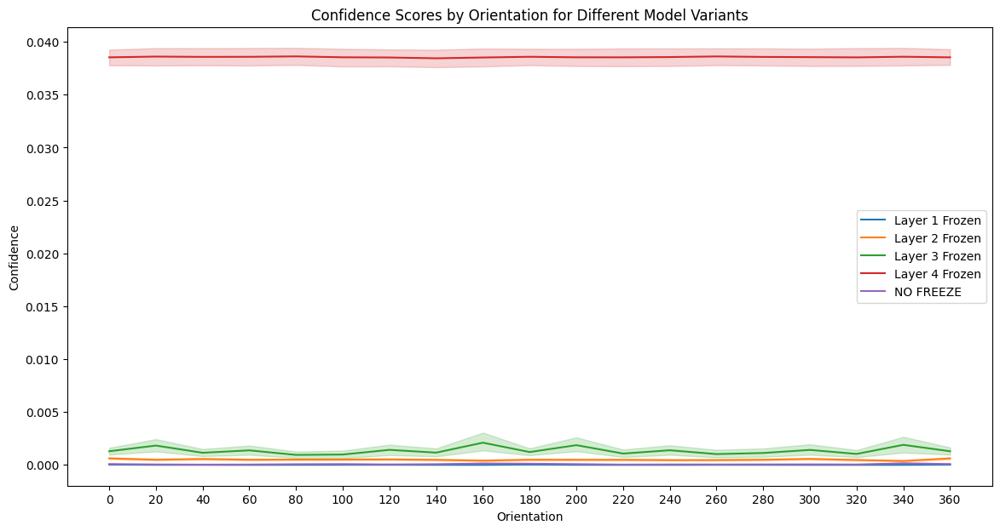

In [10]:
# WRIE THE DATA TO A CSV FIRST
df1_melted = pd.melt(df1, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df2_melted = pd.melt(df2, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df3_melted = pd.melt(df3, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df4_melted = pd.melt(df4, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df5_melted = pd.melt(df5, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 7))

sns.lineplot(x='Orientation', y='Confidence', data=df1_melted, label='Layer 1 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df2_melted, label='Layer 2 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df3_melted, label='Layer 3 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df4_melted, label='Layer 4 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df5_melted, label='NO FREEZE')


# If you have other dataframes:
# sns.lineplot(x='Orientation', y='Confidence', data=df2_melted, label='Layer 2 Frozen')
# ... Similarly for df3_melted and df4_melted

plt.title('Confidence Scores by Orientation for Different Model Variants')
plt.xlabel('Orientation')
plt.ylabel('Confidence')
plt.legend()
plt.show()

In [37]:
import pandas as pd

df1 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet34_layer1_freeze_confidence_scores.csv')  # Model with layer1 frozen
df2 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet34_layer2_freeze_confidence_scores.csv')
df3 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet34_layer3_freeze_confidence_scores.csv')
df4 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet34_layer4_freeze_confidence_scores.csv')
df5 = pd.read_csv('/content/drive/MyDrive/ISCR/experiment_data/resnet34_NO_FREEZE_confidence_scores.csv')

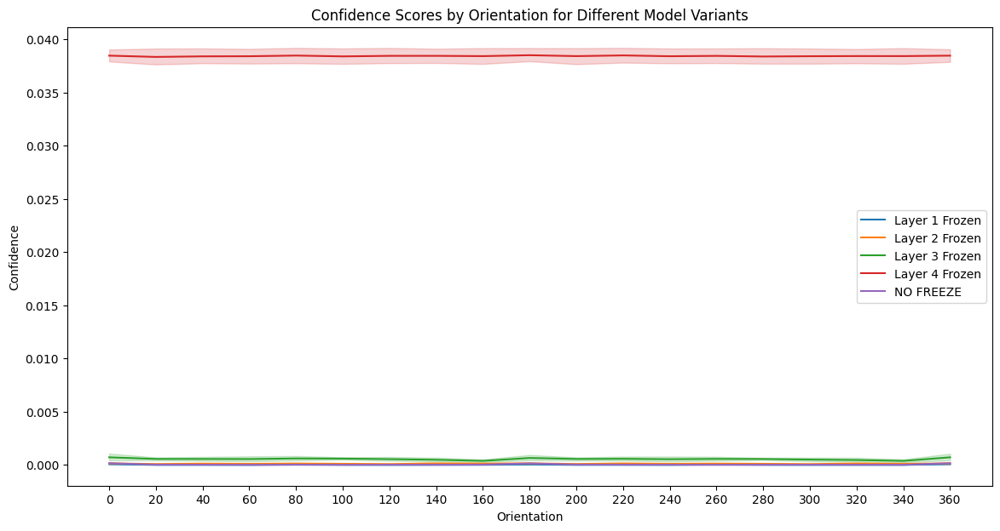

In [38]:
# WRIE THE DATA TO A CSV FIRST
df1_melted = pd.melt(df1, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df2_melted = pd.melt(df2, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df3_melted = pd.melt(df3, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df4_melted = pd.melt(df4, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
df5_melted = pd.melt(df5, id_vars=['ALPHABET', 'CLASS'], value_vars=[str(i) for i in range(0, 361, 20)],
                     var_name='Orientation', value_name='Confidence')
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 7))

sns.lineplot(x='Orientation', y='Confidence', data=df1_melted, label='Layer 1 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df2_melted, label='Layer 2 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df3_melted, label='Layer 3 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df4_melted, label='Layer 4 Frozen')
sns.lineplot(x='Orientation', y='Confidence', data=df5_melted, label='NO FREEZE')


# If you have other dataframes:
# sns.lineplot(x='Orientation', y='Confidence', data=df2_melted, label='Layer 2 Frozen')
# ... Similarly for df3_melted and df4_melted

plt.title('Confidence Scores by Orientation for Different Model Variants')
plt.xlabel('Orientation')
plt.ylabel('Confidence')
plt.legend()
plt.show()

## Grad-CAM



1. Model Inferences
2. Grad Cam Generate Rotated Images
3. Ablation Testing
4.

In [39]:
model = models.resnet18(pretrained=True)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [41]:
!pip install pytorch-gradcam


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 13.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-gradcam: filename=pytorch_gradcam-0.2.1-py3-none-any.whl size=5247 sha256=1b7c629fabb04aef6b80f038f3bdb1e1791b6631870e65f03e708d547e878f5c
  Stored in directory: /root/.cache/pip/wheels/6f/f1/8f/96c81d13f617841f23cae192a77fea3e9e988d058ba9414f2c
Successfully built pytorch-gradcam


In [42]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
from gradcam.utils import visualize_cam
from gradcam import GradCAM, GradCAMpp


In [45]:
model = models.resnet18(pretrained=True)
model.eval()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)

        # Use the 'alphabet' as the true_label to get the confidence score for the image
        confidence = get_image_confidence(model, full_path, alphabet)

        # Group scores in the dictionary
        if alphabet_class_key in confidence_scores:
            confidence_scores[alphabet_class_key].append(confidence)
        else:
            confidence_scores[alphabet_class_key] = [confidence]

In [44]:
sorted_files[0]

'A_1.png'

In [55]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess(img).unsqueeze(0)

In [83]:
import re
pattern = r'^([A])_(1)(_\d{1,3})?\.png$'

def sorting_key(img):
    match = re.match(pattern, img)
    if not match:
        return None
    alphabet = match.group(1)
    classname = int(match.group(2))
    orientation = int(match.group(3).replace("_", "")) if match.group(3) else 0
    return (alphabet, classname, orientation)

# Filter based on regex and then sort
all_files = os.listdir(folder_path)
sorted_files = sorted((file_name for file_name in all_files if sorting_key(file_name)), key=sorting_key)


print(sorted_files)

['A_1.png', 'A_1_20.png', 'A_1_40.png', 'A_1_60.png', 'A_1_80.png', 'A_1_100.png', 'A_1_120.png', 'A_1_140.png', 'A_1_160.png', 'A_1_180.png', 'A_1_200.png', 'A_1_220.png', 'A_1_240.png', 'A_1_260.png', 'A_1_280.png', 'A_1_300.png', 'A_1_320.png', 'A_1_340.png', 'A_1_360.png']


In [84]:
import collections
collection_grad_cams = collections.defaultdict()
for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)
        img = Image.open(full_path).convert("RGB")
        print(img)
        target_layer = model.layer4[-1]
        gradcam = GradCAM(model, target_layer)
        input_tensor = preprocess(img).unsqueeze(0)
        mask, logit = gradcam(input_tensor, class_idx=None)  # If you don't specify class_idx, it takes the maximum scoring class
        heatmap, result = visualize_cam(mask, input_tensor)
        result_transposed = result.permute(1, 2, 0)
        result_transposed = result_transposed.clamp(0, 1)
        collection_grad_cams[file_name] = result_transposed

<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC5AA18A7D0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5AAFF7970>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC599DD8BE0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC59A013550>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AAFF7E80>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC599DE61D0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC599DD8160>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC599DE5FF0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5AAFF4490>
<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC599DE5DB0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC599DE5C90>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC599DE5B40>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC599DE59C0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AAFF76A0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC59A013040>
<PIL.Image.Image image mode=RGB size=172x1

In [81]:
  # if your tensor is in float format
collection_grad_cams

defaultdict(None,
            {'A_1.png': tensor([[[0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      ...,
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.0000]],
             
                     [[0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      ...,
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.0000]],
             
                     [[0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      [0.6178, 0.6672, 0.8675],
                      ...,
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.0000],
                      [0.6178, 0.8525, 1.000

/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_20.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_40.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_60.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_80.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_100.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_120.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_140.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_160.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_180.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_200.png
/content/drive/MyDrive/iscr_image_dataset/letter_nu

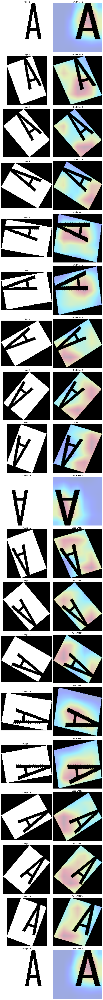

In [85]:
# Sample data: Replace with your images and heatmaps
import matplotlib.pyplot as plt
from PIL import Image

# Sample data structure based on your description
heatmaps_dict = collection_grad_cams

# Create a grid of subplots
rows = len(sorted_files)
fig, axarr = plt.subplots(rows, 2, figsize=(10, 5 * rows))

for idx, file_path in enumerate(sorted_files):
    # Load original image
    full_path = os.path.join(folder_path, file_path)
    image = Image.open(full_path).convert("RGB")
    print(full_path)
    # Get the corresponding heatmap from the dictionary
    heatmap = heatmaps_dict[file_path]

    # Display original image
    axarr[idx, 0].imshow(image)
    axarr[idx, 0].axis('off')
    axarr[idx, 0].set_title(f'Image {idx + 1}')

    # Display image with overlayed heatmap
    axarr[idx, 1].imshow(heatmap)
    axarr[idx, 1].axis('off')
    axarr[idx, 1].set_title(f'Grad-CAM {idx + 1}')

plt.tight_layout()
plt.show()


### Ablation Studies: With Grad-CAM

In [86]:
# ABLATION FOR LAYER 1:

confidence_scores_1_ablated = {}
ablated_model_1 = copy.deepcopy(model)
setattr(ablated_model_1, 'layer1', torch.nn.Identity())
collection_grad_cams_ablated_1 = collections.defaultdict()


for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)
        img = Image.open(full_path).convert("RGB")
        print(img)
        target_layer = ablated_model_1.layer4[-1]
        gradcam = GradCAM(ablated_model_1, target_layer)
        input_tensor = preprocess(img).unsqueeze(0)
        mask, logit = gradcam(input_tensor, class_idx=None)  # If you don't specify class_idx, it takes the maximum scoring class
        heatmap, result = visualize_cam(mask, input_tensor)
        result_transposed = result.permute(1, 2, 0)
        result_transposed = result_transposed.clamp(0, 1)
        collection_grad_cams_ablated_1[file_name] = result_transposed

<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC596FE38B0>


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3737: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC596FE2EC0>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC599DD3F10>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC599E341C0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AAEA9300>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AAEAB6D0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AAE9B2E0>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC5AAE9B0D0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5AAEABAC0>
<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC59A0133D0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC599DD3FA0>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC5AAE98640>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AAEABCD0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AB010B20>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AB012F20>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AB013970>
<PIL.Image.Image image mode=RGB size=166x

/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_20.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_40.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_60.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_80.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_100.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_120.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_140.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_160.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_180.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_200.png
/content/drive/MyDrive/iscr_image_dataset/letter_nu

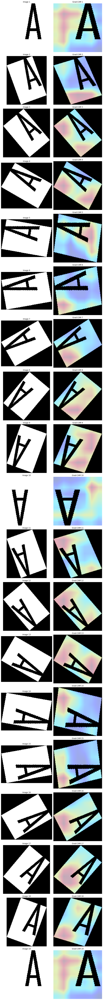

In [90]:
heatmaps_dict = collection_grad_cams_ablated_1

# Create a grid of subplots
rows = len(sorted_files)
fig, axarr = plt.subplots(rows, 2, figsize=(10, 5 * rows))

for idx, file_path in enumerate(sorted_files):
    # Load original image
    full_path = os.path.join(folder_path, file_path)
    image = Image.open(full_path).convert("RGB")
    print(full_path)
    # Get the corresponding heatmap from the dictionary
    heatmap = heatmaps_dict[file_path]

    # Display original image
    axarr[idx, 0].imshow(image)
    axarr[idx, 0].axis('off')
    axarr[idx, 0].set_title(f'Image {idx + 1}')

    # Display image with overlayed heatmap
    axarr[idx, 1].imshow(heatmap)
    axarr[idx, 1].axis('off')
    axarr[idx, 1].set_title(f'Grad-CAM {idx + 1}')

plt.tight_layout()
plt.show()

In [87]:
# ABLATION FOR LAYER 2:
collection_grad_cams_ablated_2 = collections.defaultdict()
ablated_model_2 = copy.deepcopy(model)
setattr(ablated_model_2, 'layer2', torch.nn.Identity())

ablated_model_2.layer3[0].conv1 = nn.Conv2d(64, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
ablated_model_2.layer3[0].downsample[0] = nn.Conv2d(64, 256, kernel_size=(1, 1), stride=(2, 2), bias=False)

for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)
        img = Image.open(full_path).convert("RGB")
        target_layer = ablated_model_2.layer4[-1]
        gradcam = GradCAM(ablated_model_2, target_layer)
        input_tensor = preprocess(img).unsqueeze(0)
        mask, logit = gradcam(input_tensor, class_idx=None)  # If you don't specify class_idx, it takes the maximum scoring class
        heatmap, result = visualize_cam(mask, input_tensor)
        result_transposed = result.permute(1, 2, 0)
        result_transposed = result_transposed.clamp(0, 1)
        collection_grad_cams_ablated_2[file_name] = result_transposed

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:3737: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_20.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_40.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_60.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_80.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_100.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_120.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_140.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_160.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_180.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_200.png
/content/drive/MyDrive/iscr_image_dataset/letter_nu

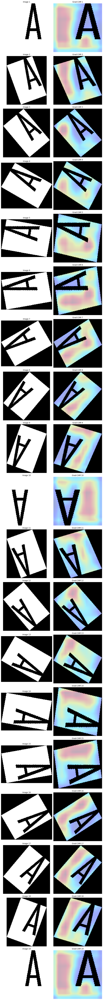

In [91]:
heatmaps_dict = collection_grad_cams_ablated_2

# Create a grid of subplots
rows = len(sorted_files)
fig, axarr = plt.subplots(rows, 2, figsize=(10, 5 * rows))

for idx, file_path in enumerate(sorted_files):
    # Load original image
    full_path = os.path.join(folder_path, file_path)
    image = Image.open(full_path).convert("RGB")
    print(full_path)
    # Get the corresponding heatmap from the dictionary
    heatmap = heatmaps_dict[file_path]

    # Display original image
    axarr[idx, 0].imshow(image)
    axarr[idx, 0].axis('off')
    axarr[idx, 0].set_title(f'Image {idx + 1}')

    # Display image with overlayed heatmap
    axarr[idx, 1].imshow(heatmap)
    axarr[idx, 1].axis('off')
    axarr[idx, 1].set_title(f'Grad-CAM {idx + 1}')

plt.tight_layout()
plt.show()

In [88]:
# ABLATION FOR LAYER 3:
collection_grad_cams_ablated_3 = collections.defaultdict()
ablated_model_3 = copy.deepcopy(model)
ablated_model_3.layer3 = torch.nn.Identity()

# Adjust the first block of layer4 to accept 128 channels
ablated_model_3.layer4[0].conv1 = nn.Conv2d(128, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
ablated_model_3.layer4[0].downsample[0] = nn.Conv2d(128, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)

for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)
        img = Image.open(full_path).convert("RGB")
        print(img)
        target_layer = ablated_model_3.layer4[-1]
        gradcam = GradCAM(ablated_model_3, target_layer)
        input_tensor = preprocess(img).unsqueeze(0)
        mask, logit = gradcam(input_tensor, class_idx=None)  # If you don't specify class_idx, it takes the maximum scoring class
        heatmap, result = visualize_cam(mask, input_tensor)
        result_transposed = result.permute(1, 2, 0)
        result_transposed = result_transposed.clamp(0, 1)
        collection_grad_cams_ablated_3[file_name] = result_transposed

<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC5970E61A0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5C74018D0>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC5AB0132B0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AB011ED0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AB0123E0>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5AA0595A0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AAECB850>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC5AAECB070>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5AAECABC0>
<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC599690DC0>
<PIL.Image.Image image mode=RGB size=138x168 at 0x7EC5AAEA94E0>
<PIL.Image.Image image mode=RGB size=166x172 at 0x7EC597010EE0>
<PIL.Image.Image image mode=RGB size=172x154 at 0x7EC5AAF16950>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC596F16560>
<PIL.Image.Image image mode=RGB size=160x118 at 0x7EC5971663B0>
<PIL.Image.Image image mode=RGB size=172x1

/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_20.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_40.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_60.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_80.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_100.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_120.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_140.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_160.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_180.png
/content/drive/MyDrive/iscr_image_dataset/letter_number_images_multi_fonts/A_1_200.png
/content/drive/MyDrive/iscr_image_dataset/letter_nu

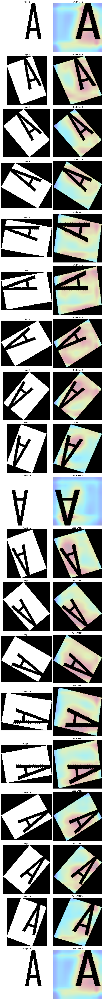

In [92]:
heatmaps_dict = collection_grad_cams_ablated_3

# Create a grid of subplots
rows = len(sorted_files)
fig, axarr = plt.subplots(rows, 2, figsize=(10, 5 * rows))

for idx, file_path in enumerate(sorted_files):
    # Load original image
    full_path = os.path.join(folder_path, file_path)
    image = Image.open(full_path).convert("RGB")
    print(full_path)
    # Get the corresponding heatmap from the dictionary
    heatmap = heatmaps_dict[file_path]

    # Display original image
    axarr[idx, 0].imshow(image)
    axarr[idx, 0].axis('off')
    axarr[idx, 0].set_title(f'Image {idx + 1}')

    # Display image with overlayed heatmap
    axarr[idx, 1].imshow(heatmap)
    axarr[idx, 1].axis('off')
    axarr[idx, 1].set_title(f'Grad-CAM {idx + 1}')

plt.tight_layout()
plt.show()

In [89]:
# ABLATION FOR LAYER 4:
collection_grad_cams_ablated_4 = collections.defaultdict()

ablated_model_4 = copy.deepcopy(model)
setattr(ablated_model_4, 'layer4', torch.nn.Identity())
ablated_model_4.fc = nn.Linear(256, 26)
for index, file_name in enumerate(sorted_files):
    match = re.match(pattern, file_name)
    if match:
        alphabet = match.group(1)  # Extracting the alphabet
        alphabet_class_key = f"{alphabet}_{match.group(2)}"
        full_path = os.path.join(folder_path, file_name)
        img = Image.open(full_path).convert("RGB")
        print(img)
        target_layer = ablated_model_4.layer4[-1]
        gradcam = GradCAM(ablated_model_4, target_layer)
        input_tensor = preprocess(img).unsqueeze(0)
        mask, logit = gradcam(input_tensor, class_idx=None)  # If you don't specify class_idx, it takes the maximum scoring class
        heatmap, result = visualize_cam(mask, input_tensor)
        result_transposed = result.permute(1, 2, 0)
        result_transposed = result_transposed.clamp(0, 1)
        collection_grad_cams_ablated_4[file_name] = result_transposed

<PIL.Image.Image image mode=RGB size=94x144 at 0x7EC69EC4C250>


TypeError: ignored